# Developing a VHH phage display library against _P. aeruginosa_ (`fig-alpaca-library`)

In [1]:
import os

# change working directory to `./panning-massive` for simplicity of access to feature tables, etc
# make sure we don't do this twice, or we'll end up in the wrong place and be very confused
if 'dir_changed' not in globals():
    os.chdir('../../')
    dir_changed = True

In [2]:
from importlib import reload

import os.path
import pandas as pd, numpy as np
import altair as alt

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
FONT_SIZE = 5

plt.rcParams.update({
    "font.family":"sans",
    "font.size": FONT_SIZE,
    "svg.fonttype": "none"
})

In [4]:
%config InlineBackend.figure_formats = ['svg']

In [5]:
import nbseq.utils

In [6]:
ft = pd.read_csv('results/tables/feature_table.txt', sep="\t", index_col=0).astype(int)
abundances = ft.sum(axis=1).rename("abundance")

df = pd.DataFrame({'abundance':abundances, 
                   'rank':abundances.rank(ascending=False), 
                   'pct':abundances.rank(ascending=False, pct=True, method='first')})

In [7]:
%%bash
mkdir -p results/plots/
mkdir -p results/tables/figures/

## Rank-Abundance (Whittaker) plot

/tmp/ipykernel_2767497/256248356.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  secax.set_xticklabels([a.get_text() for a in secax.get_xticklabels()], rotation = 45, ha='left')
/tmp/ipykernel_2767497/256248356.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([a.get_text() for a in ax.get_xticklabels()], rotation = -45, ha='left')


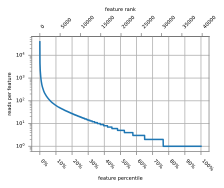

In [8]:
import matplotlib.ticker as ticker

fig, ax = plt.subplots(layout='constrained', figsize=(3,2.5))
ax.plot('pct', 'abundance', data=df)
ax.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.xaxis.set_major_formatter(ticker.PercentFormatter(1.0))
ax.set_xlabel('feature percentile')

n_features = df['rank'].max()

def rank2pct(x):
    return x / n_features

def pct2rank(x):
    return x * n_features

secax = ax.secondary_xaxis('top', functions=(pct2rank, rank2pct), )
secax.set_xlabel('feature rank')
ax.set_ylabel('reads per feature')

for a in [ax, secax]:
    a.tick_params(color='#878787', which='both')
    for spine in ax.spines.values():
        spine.set_edgecolor('#878787')
    
plt.draw()

secax.set_xticklabels([a.get_text() for a in secax.get_xticklabels()], rotation = 45, ha='left')
ax.set_xticklabels([a.get_text() for a in ax.get_xticklabels()], rotation = -45, ha='left')

plt.grid()
plt.yscale('log')

plt.savefig('results/plots/rank-percentile.svg')

In [9]:
(df
 .rename(columns={
     'abundance': 'reads per feature',
     'rank':'feature abundance rank',
     'pct':'feature abundance percentile'})
 .to_csv('results/tables/figures/rank-percentile.csv', index=False))

## CDR lengths

In [10]:
import nbseq.viz.qc

In [11]:
cdrs = pd.read_csv("results/tables/alpaca_cdrs.csv", index_col=0)
cdr_lens = cdrs.applymap(nbseq.utils.len_ungapped)

In [12]:
min_CDR_length = {
    'CDR1': 4,
    'CDR2': 6,
    'CDR3': 5,
    'FR4':  2
}

for segment, min_len in min_CDR_length.items():
    cdr_lens = cdr_lens.loc[cdr_lens[segment] >= min_len,:]

# for col in cdr_lens.columns:
#     print(cdr_lens[col].value_counts())

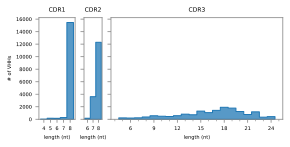

In [13]:
from matplotlib.ticker import FixedLocator, MultipleLocator, MaxNLocator
ml = MultipleLocator(1)

df = cdr_lens.join(abundances)
fig, axs = nbseq.viz.qc.segment_len_plot(df, weighted=False, fig_kw=dict(figsize=(4,2)), discrete=1, element='step');
axs.flat[0].set_ylabel('# of VHHs');

for ax in axs:
    ax.tick_params(color='#878787', which='both')
    for spine in ax.spines.values():
        spine.set_edgecolor('#878787')
        
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.xaxis.set_minor_locator(ml)
    ax.xaxis.set_tick_params(which='minor', bottom=True, length=2)
    
plt.draw()
plt.savefig('results/plots/cdr_lengths.svg')

In [14]:
def export_hist(series, int_bins=False, one_sided='upper', **kwargs):
    if int_bins:
        nbins = series.max()-series.min()
    else:
        nbins = None
    values, bins, _ = plt.hist(series, **{'bins': nbins, **kwargs});

    bin_edges = []
    bin_l = []
    bin_r = []
    for i in range(len(values)):
        bin_edges.append(f'[{bins[i]}, {bins[i+1]})')
        bin_l.append(bins[i])
        bin_r.append(bins[i+1])
    
    if one_sided:
        if one_sided == 'upper':
            bin = bin_r
        elif one_sided == 'lower':
            bin = bin_l
        return pd.DataFrame({
            'name': series.name,
            # f'{series.name} bin lower bound': bin_l, 
            # f'{series.name} bin upper bound': bin_r,
            'value': bin,
            'number of observations': values})            
        
    return pd.DataFrame({
        'name': series.name,
        # f'{series.name} bin lower bound': bin_l, 
        # f'{series.name} bin upper bound': bin_r,
        'bin lower bound': bin_l, 
        'bin upper bound': bin_r,
        'number of observations': values})

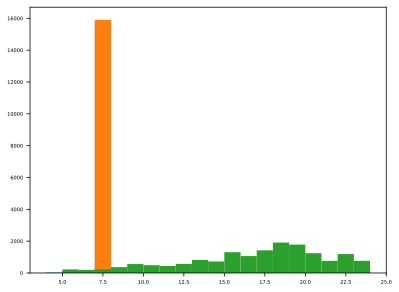

In [15]:
pd.concat([
    export_hist(df['CDR1'], int_bins=True),
    export_hist(df['CDR2'], int_bins=True),
    export_hist(df['CDR3'], int_bins=True)
]).to_csv('results/tables/figures/cdr_lengths.csv')

## Sequence Logo

In [16]:
import nbseq.viz.logo
import logomaker

In [17]:
seqs = pd.read_csv("results/tables/alpaca_translated_aligned.csv", index_col=0).join(abundances)

In [18]:
matrix = nbseq.viz.logo.alignment_to_matrix(seqs['aligned'],seqs['abundance'],
                                            characters_to_ignore='.'
                                           )

matrix.to_csv("results/tables/position_diversity.csv")

In [19]:
cons = nbseq.asvs.consensus(matrix.drop(columns="-"), min_fraction=0.05)

cons

'VESGGGLVQPGGSLRLSCAASGFTFSIYAMGWYRQAPGKERELVACISTSGGSTYYADSVKGRFTISRDNAKNTVYLQMNSLKPEDTAVYYCAANRLRELTIQIRGGGSPPYEYDYWGQSEPETYWG'

In [20]:
domains = {
    "FR1":  [0,  21,  +1],
    "CDR1": [21, 29,  +1],
    "FR2":  [29, 46,  +1],
    "CDR2": [46, 54,  +1],
    "FR3":  [54, 92,  +1],
    "CDR3": [92, 116, +1],
    "FR4":  [116,127, +1],
}

In [21]:
logo_width = 8
logo_ratio = (8/matrix.index.max())
logo_size = (logo_width, logo_width*logo_ratio)

In [22]:
chemistry_ambig_palette_letters = {}
for (chars, color, label) in nbseq.viz.logo.chemistry_ambig:
    for c in chars:
        chemistry_ambig_palette_letters[c] = color

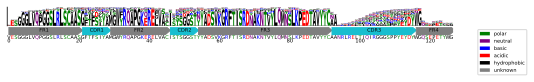

In [23]:
fig, axs = plt.subplots(nrows=2, ncols=1, 
                        figsize=logo_size, 
                        gridspec_kw=dict(height_ratios=[0.7, 0.3], hspace=0.1))
logo, df = nbseq.viz.logo.make_logo(
    seqs, 
    matrix=matrix.drop(columns="-"), 
    ax=axs[0])
ax = axs[0]
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

import matplotlib.patches as mpatches
# import matplotlib.patches.FancyArrowPatch

ax = axs[1]

sequence_length = max(max(x) for x in domains.values())


def _get_ax_width(ax, unit="inch"):
    """Return the ax's width in 'inches' or 'pixel'."""
    transform = ax.figure.dpi_scale_trans.inverted()
    bbox = ax.get_window_extent().transformed(transform)
    width = bbox.width
    if unit == "pixel":
        width *= ax.figure.dpi
    return width



for name, pos in domains.items():
    if 'CDR' in name:
        color = '#17becf'
    else:
        color = '#7f7f7f'

    y = 0
    feature_length = pos[1]-pos[0]
    posA = (pos[0], y)
    posB = (pos[1], y)

    thickness = 20

    width_pixel = _get_ax_width(ax, unit="pixel")
    head_length = 0.5 * width_pixel * feature_length / sequence_length
    head_length = min(head_length, 0.6 * thickness)

    arrowstyle = mpatches.ArrowStyle.Simple(
        head_width=thickness,
        tail_width=thickness,
        head_length=head_length,
    )
    
    arrow = mpatches.FancyArrowPatch(
        posA, posB,
        # mutation_scale=100, 
        shrinkA=0.0,
        shrinkB=0.0,
        arrowstyle=arrowstyle,
        color=color)
    ax.text(pos[0]+(feature_length//2), y, name, ha='center', va='center')
                                      
    # (x_tail + 1, y_tail - .4, dx, dy,
    #          width=.1, length_includes_head=True, color="C2")
    ax.add_patch(arrow)


axs[1].set_xlim(axs[0].get_xlim())
cons_height = 10
axs[1].set_ylim([-(thickness + cons_height), +thickness])


y = -(thickness + cons_height)
for i,k in enumerate(cons):
    ax.text(i, y, k, color=chemistry_ambig_palette_letters[k], va='top', ha='center')
# ax.set_xlim([0,128])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='x', length=0)
# ax.spines['left'].set_visible(False)
# ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.draw()
plt.savefig('results/plots/logo.svg')

## Phylogeny

In [24]:
import nbseq.viz.tree
from nbseq.viz.tree import plot_tree_alt, fortify_tree
import skbio.tree

In [25]:
tree = skbio.tree.TreeNode.read("results/tables/cdr3/msa-muscle.nwk", format="newick")

In [26]:
# fd = pd.read_csv("results/tables/alpaca_aa_filtered.csv")
fd = pd.read_csv("results/tables/alpaca_cdrs_filtered.csv", index_col=0)
fd = nbseq.identify_clonotype(fd,id_col='clonotypeID',seq_col='clonotype')
fd = nbseq.identify_clonotype(fd,cdrs=['CDR3'],id_col='CDR3ID',seq_col=None)
fd.index = fd.index.rename('ASVSEQ')

In [27]:
nodes_df, links_df = fortify_tree(fd, tree, clade_colors=False, identifier='ASVSEQ')
nodes_df['color'] = '#'+nodes_df['CDR3ID'].str.slice(0,6)

In [28]:
chart = plot_tree_alt(nodes_df, links_df, identifier='CDR3ID', label=None)

In [29]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [30]:
chart.properties(width=300,height=1000)

alt.LayerChart(...)

Write phylogeny with more interpretable names

In [31]:
for tip in tree.tips():
    tip.name = f"clonotypeID={fd.loc[tip.name,'clonotypeID']};CDR3ID={fd.loc[tip.name,'CDR3ID']}"

In [32]:
tree.write('results/tables/figures/phylogeny.nwk')

'results/tables/figures/phylogeny.nwk'